# 3. Fitting diads once you have groups
- Once you have divided your diads into groups based on strengths, you need to tweak the fit parameters for each group
- Then you can loop through all files in a given group and automatically fit the spectra

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import DiadFit as pf
pf.__version__

'0.0.88'

## Specifying filetype, and folder as before

In [2]:
# This specifies what file type your Raman exported in. 
meta_path, spectra_path, spectra_filetype, prefix, str_prefix, spectra_file_ext, meta_file_ext, TruPower=pf.get_settings()

## Load in data and fit parameters
- This loads in the dataframes of the fit parameters you saved in the other file, by group
- At this point you select what group you want to fit (batch = 'Weak', 'Medium' or 'Strong'). After running through the entire notebook for one group, come back up here to fit a second group.

In [3]:
## load dataframes and numpy arrays 
np_x = joblib.load('np_x.sav')

# Select the group you want to fit ('Weak', 'Medium', 'Strong'). After selecting one, go through and select another one and run again from here. 
batch='Weak' # Options are Weak, Medium, Strong

if batch=='Weak':
    GroupN_df=joblib.load('Weak_df.sav')
if batch=='Medium':
    GroupN_df=joblib.load('Medium_df.sav')
if batch=='Strong':
    GroupN_df=joblib.load('Strong_df.sav')

### Now load one file from this group to tweak parameters for

In [4]:
Diad_Files =GroupN_df['filename']
i=0


### Lets plot the diad to have a look at it

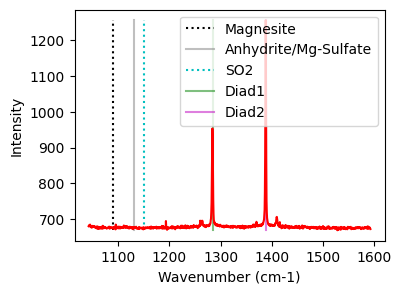

In [5]:
plot1=pf.plot_diad(path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype)

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

## Choose a model for fitting all peaks
- Option of Voigt or PseudoVoigt. We recomend PsuedoVoigt

In [6]:
model_name='PseudoVoigtModel'

## Fit Diad 1
- Tweak the parameters in the config files for each group. E.g. how many peaks (fit_peaks), the background positions, the sigma of the diad, and whether or not you want a gaussian background

In [7]:
diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
diad_id_config

if batch=='Weak':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250),
    upper_bck_diad1=(1300, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Medium':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240),
    upper_bck_diad1=(1315, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Strong':
    diad1_fit_config_init=pf.diad1_fit_config(
    fit_gauss=True, gauss_amp= 2*GroupN_df['HB1_abs_prom'].iloc[i],
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250), upper_bck_diad1=(1300, 1350), fit_gauss=False, gauss_amp=1000, diad_sigma=0.6, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=279.7193370194584, HB_prom=nan, x_range_baseline=30, y_range_baseline=100, dpi=200, x_range_residual=10, return_other_params=False)

### See what these fit parameters look like for diad1

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_cent_err,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,Diad1_Combofit_Height,Diad1_Residual,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad1_PDF_Model
0,1284.091131,1284.091131,0.010141,818.540114,1.057252,0,280.679513,3.512647,0.707913,2.114504,Flagged Warnings:,1.147458,1.142163,0.3118,0.007534,PseudoVoigtModel


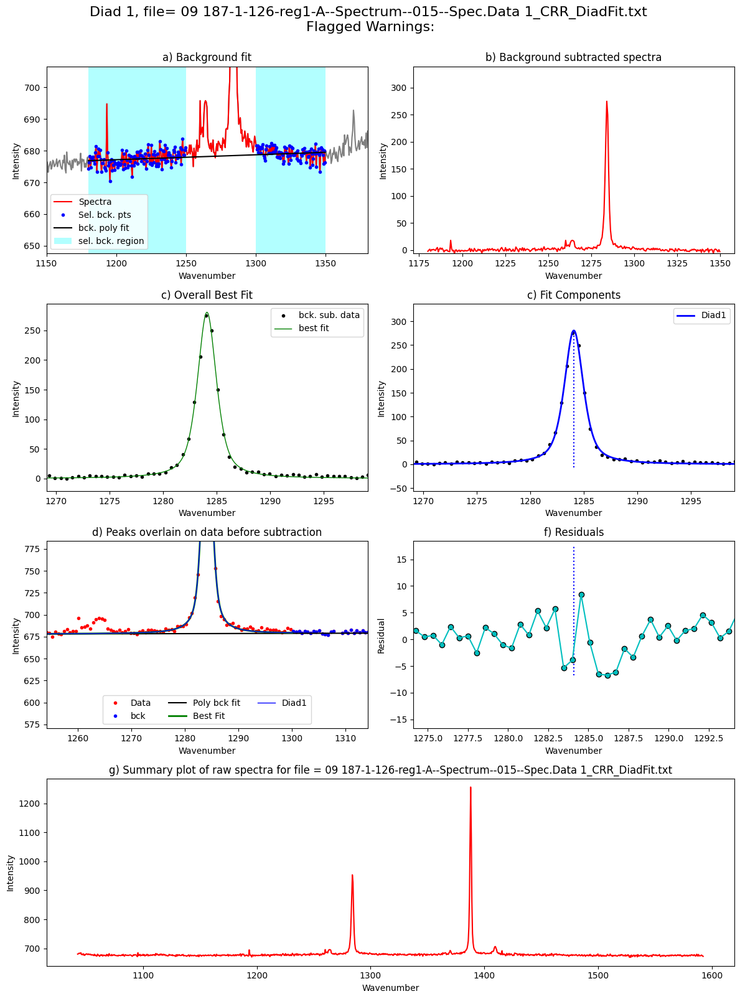

In [8]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config,
path=spectra_path, filename=Diad_Files.iloc[0],
filetype=spectra_filetype, plot_figure=True, close_figure=False,
Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
HB_pos=GroupN_df['HB1_pos'].iloc[i])
Diad1_fit

### Update the sigma
- The sigma parameter varies quite a lot based on the splitting. Best to update your first guess with what you found for the example file above

In [9]:
diad1_fit_config2=diad1_fit_config_init

## Fit diad2

In [10]:
if batch=='Weak':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=2, upper_bck_diad2=(1430, 1480),
    lower_bck_diad2=(1310, 1360), diad_sigma=0.4,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Medium':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1350), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Strong':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init
diad2_fit_config_init

diad2_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad2=2, lower_bck_diad2=(1310, 1360), upper_bck_diad2=(1430, 1480), fit_gauss=False, gauss_amp=1000, diad_sigma=0.4, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=577.581651385618, HB_prom=nan, C13_prom=10, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=30, return_other_params=False)

### See what these fit parameters look like for diad2

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_cent_err,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,Diad2_Combofit_Height,Diad2_Residual,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad2_PDF_Model
0,1388.024089,1388.024089,0.005248,1269.116541,0.796228,0,578.17336,4.076993,0.706563,1.592456,Flagged Warnings:,1.034335,1.081123,0.054677,0.002754,PseudoVoigtModel


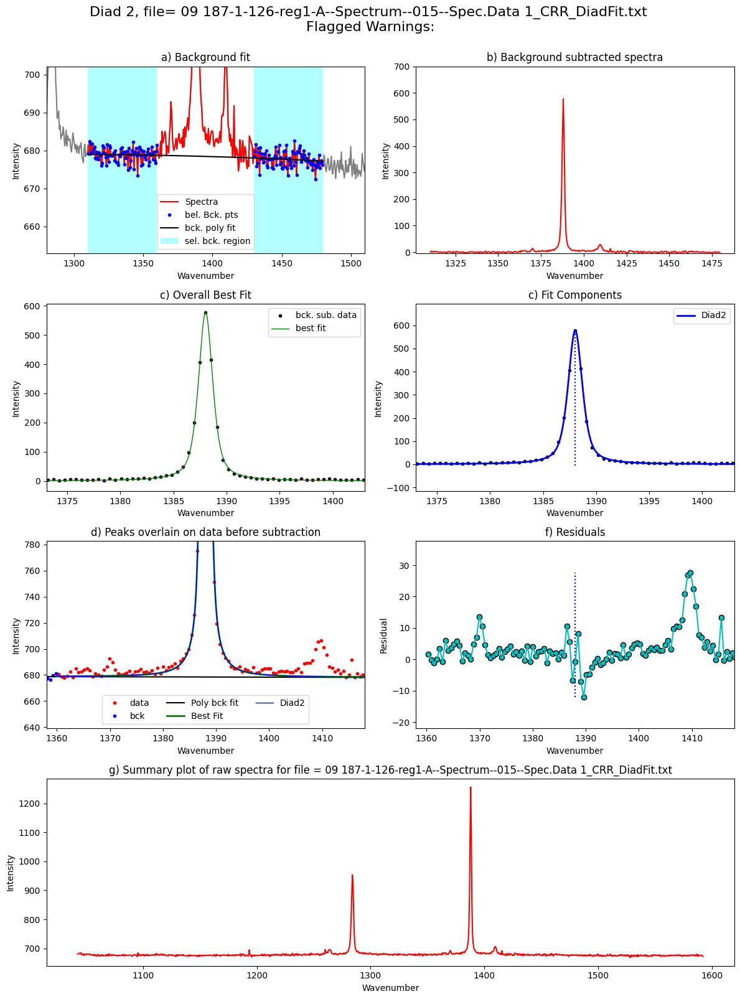

In [11]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config,
path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype,
plot_figure=True, close_figure=False, 
Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
HB_pos=GroupN_df['HB2_pos'].iloc[i], 
C13_pos=GroupN_df['C13_pos'].iloc[i])
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

## Loop over all the files in the group
- This will loop over all the 

  0%|          | 0/23 [00:00<?, ?it/s]

Processing file: 09 187-1-126-reg1-A--Spectrum--015--Spec.Data 1_CRR_DiadFit.txt


  4%|▍         | 1/23 [00:02<00:55,  2.51s/it]

Processing file: 10 187-1-126-reg1-B--Spectrum--018--Spec.Data 1_CRR_DiadFit.txt


  9%|▊         | 2/23 [00:05<00:53,  2.56s/it]

Processing file: 11 187-1-126-reg1-C--Spectrum--022--Spec.Data 1_CRR_DiadFit.txt


 13%|█▎        | 3/23 [00:07<00:51,  2.59s/it]

Processing file: 12 187-1-126-reg1-D--Spectrum--025--Spec.Data 1.txt


 17%|█▋        | 4/23 [00:10<00:50,  2.65s/it]

Processing file: 13 187-1-126-reg1-E--Spectrum--028--Spec.Data 1.txt


 22%|██▏       | 5/23 [00:13<00:47,  2.66s/it]

Processing file: 14 187-1-126-reg1-F--Spectrum--031--Spec.Data 1.txt


 26%|██▌       | 6/23 [00:15<00:43,  2.55s/it]

Processing file: 16 187-1-126-reg1-G--Spectrum--035--Spec.Data 1_CRR_DiadFit.txt


 30%|███       | 7/23 [00:18<00:43,  2.70s/it]

Processing file: 18 187-1-126-reg1-H--Spectrum--039--Spec.Data 1.txt


 35%|███▍      | 8/23 [00:21<00:40,  2.70s/it]

Processing file: 19 187-1-126-reg1-I--Spectrum--042--Spec.Data 1_CRR_DiadFit.txt


 39%|███▉      | 9/23 [00:23<00:35,  2.52s/it]

Processing file: 20 187-1-126-reg1-J--Spectrum--045--Spec.Data 1.txt


 43%|████▎     | 10/23 [00:25<00:32,  2.49s/it]c:\users\charl\documents\python dev\diadfit\src\DiadFit\diads.py:3104: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))


Processing file: 21 187-1-126-reg2-A--Spectrum--048--Spec.Data 1_CRR_DiadFit.txt


 48%|████▊     | 11/23 [00:28<00:29,  2.44s/it]

Processing file: 23 187-1-126-reg2-B--Spectrum--052--Spec.Data 1.txt


 52%|█████▏    | 12/23 [00:30<00:26,  2.40s/it]

Processing file: 24 187-1-126-reg2-C--Spectrum--055--Spec.Data 1.txt


 57%|█████▋    | 13/23 [00:32<00:23,  2.30s/it]

Processing file: 25 187-1-126-reg3-A--Spectrum--058--Spec.Data 1.txt


 61%|██████    | 14/23 [00:34<00:21,  2.36s/it]

Processing file: 26 187-1-126-reg3-B--Spectrum--061--Spec.Data 1_CRR_DiadFit.txt


 65%|██████▌   | 15/23 [00:37<00:18,  2.34s/it]

Processing file: 28 187-1-126-reg3-C--Spectrum--065--Spec.Data 1.txt


 70%|██████▉   | 16/23 [00:39<00:16,  2.32s/it]

Processing file: 29 187-1-126-reg3-D--Spectrum--068--Spec.Data 1.txt


 74%|███████▍  | 17/23 [00:41<00:13,  2.32s/it]

Processing file: 30 187-1-126-reg4-A--Spectrum--072--Spec.Data 1_CRR_DiadFit.txt


 78%|███████▊  | 18/23 [00:44<00:12,  2.49s/it]

Processing file: 31 187-1-126-reg4-B--Spectrum--075--Spec.Data 1_CRR_DiadFit.txt


 83%|████████▎ | 19/23 [00:46<00:09,  2.38s/it]

Processing file: 32 187-1-126-reg4-B--Spectrum--076--Spec.Data 1_CRR_DiadFit.txt


 87%|████████▋ | 20/23 [00:48<00:06,  2.30s/it]

Processing file: 33 187-1-126-reg4-C--Spectrum--079--Spec.Data 1.txt


 91%|█████████▏| 21/23 [00:51<00:04,  2.31s/it]

Processing file: 35 187-1-126-reg5-A--Spectrum--083--Spec.Data 1_CRR_DiadFit.txt


 96%|█████████▌| 22/23 [00:53<00:02,  2.28s/it]

Processing file: 38 187-1-126-reg5-B--Spectrum--089--Spec.Data 1.txt


100%|██████████| 23/23 [00:55<00:00,  2.43s/it]


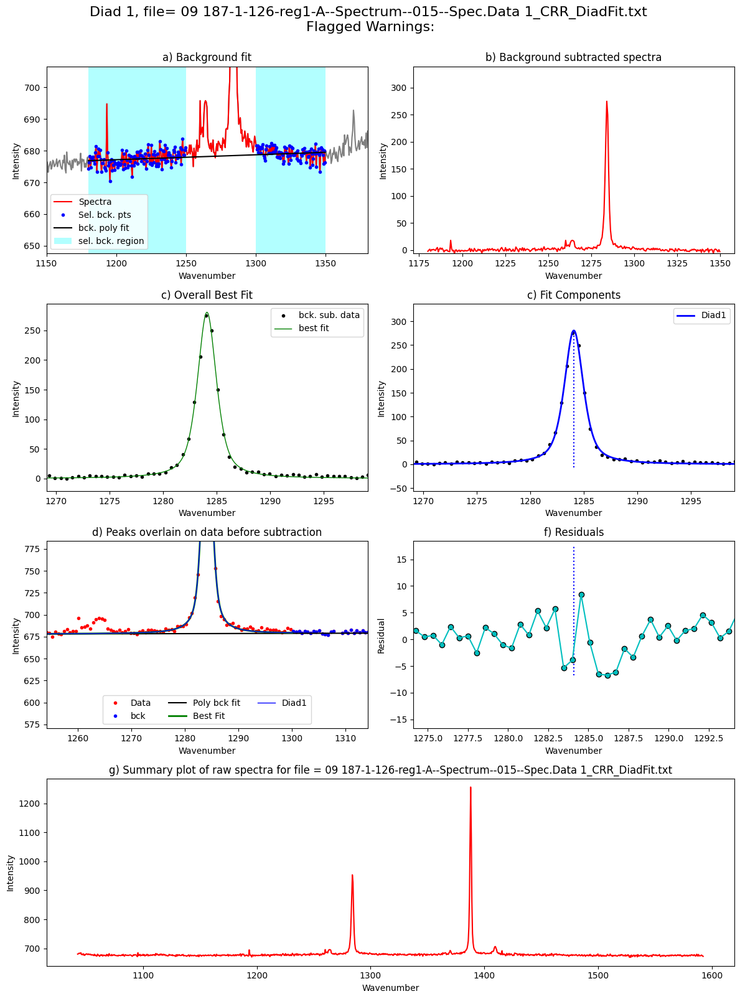

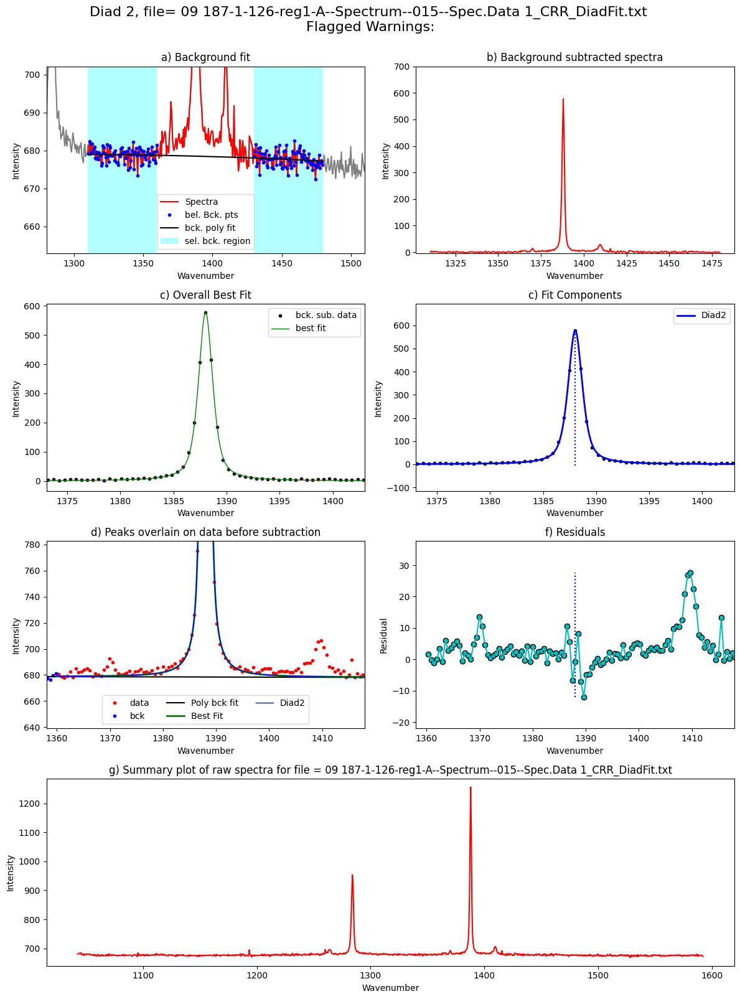

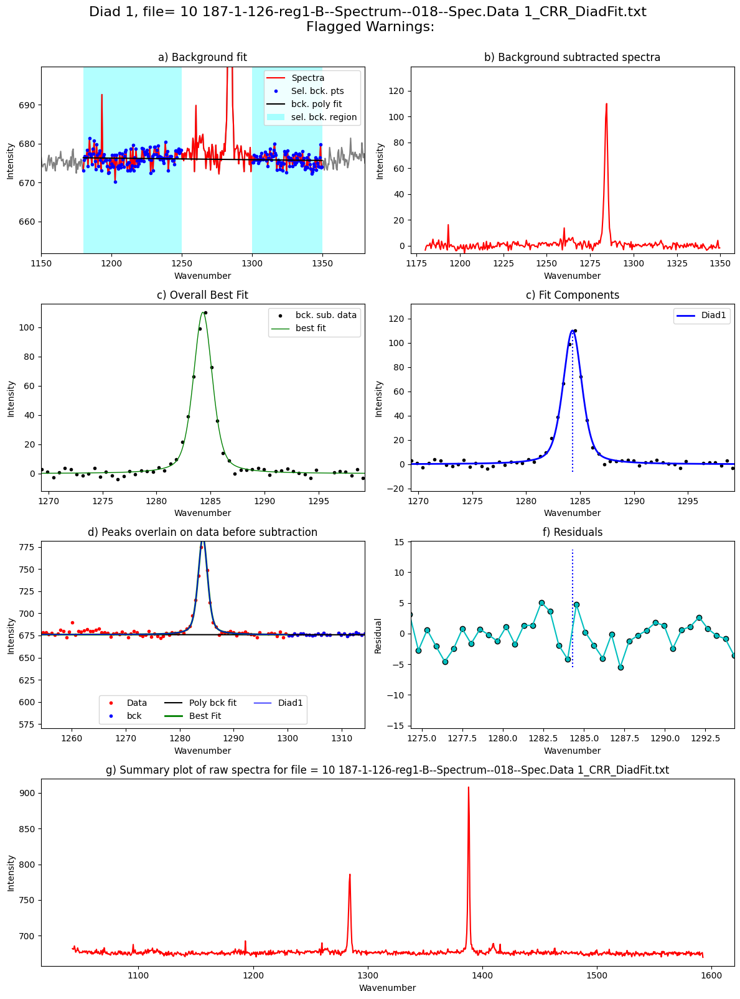

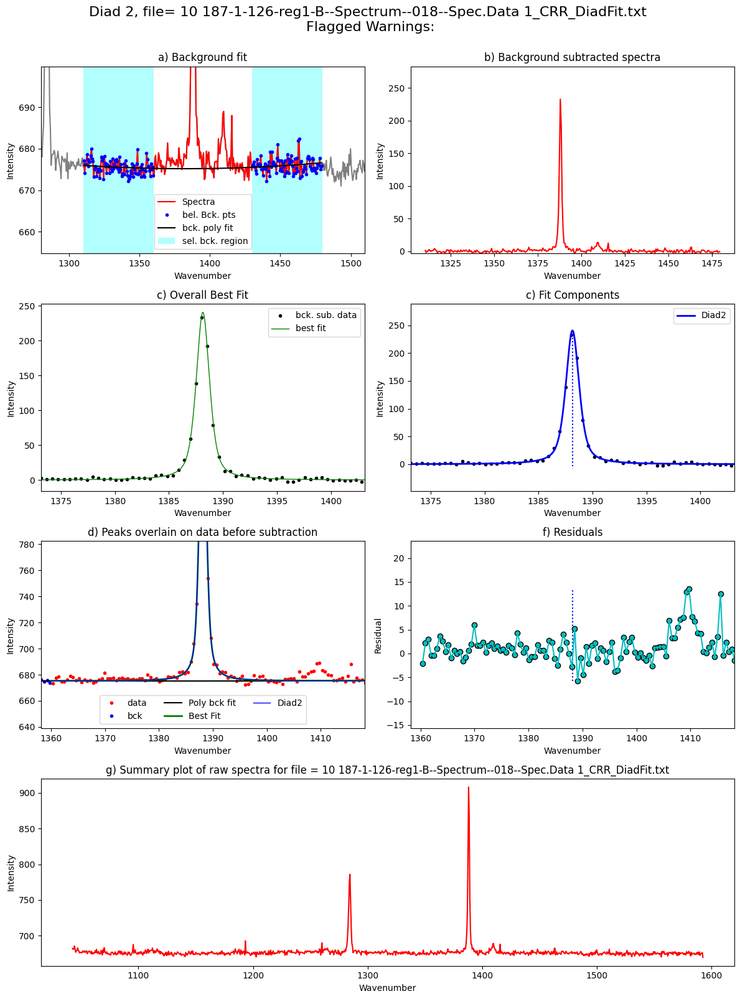

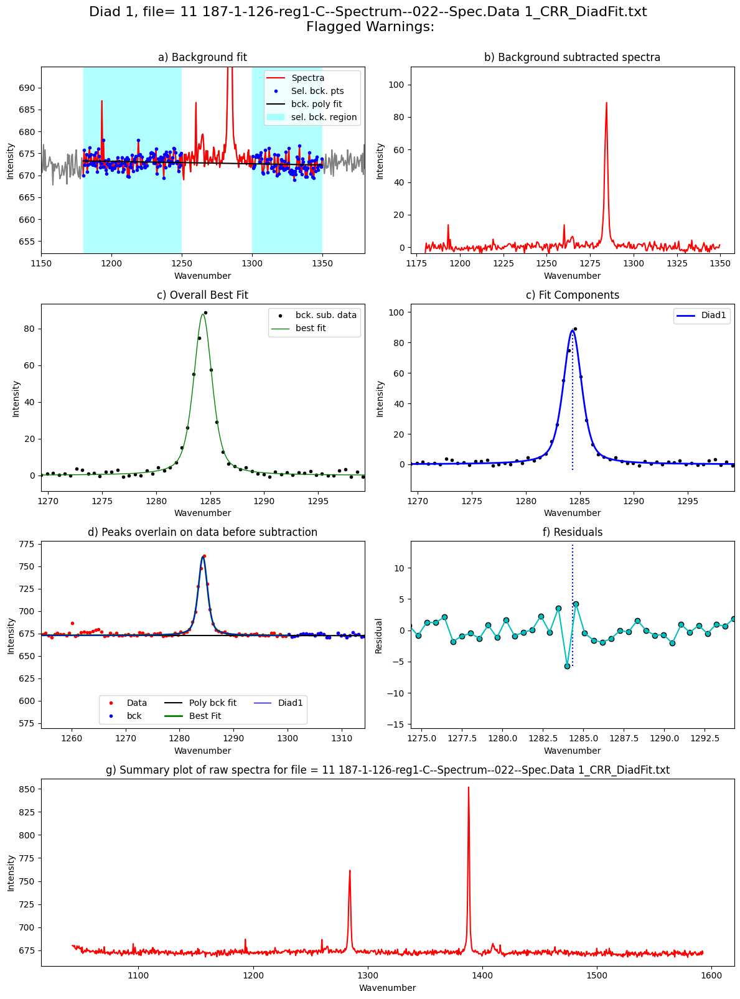

...

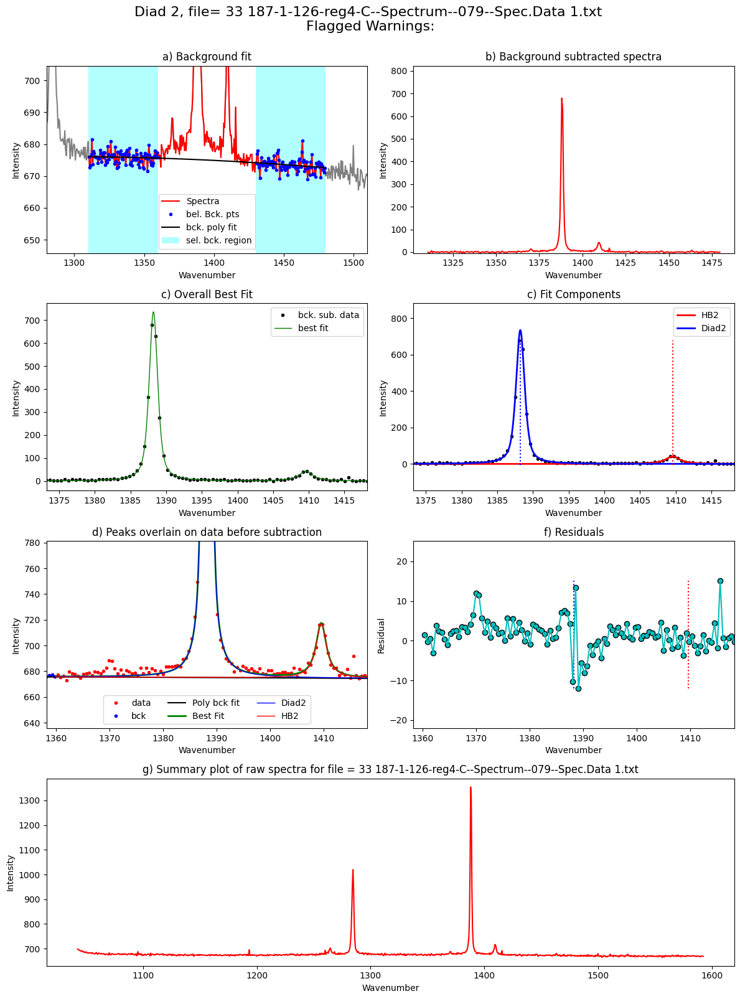

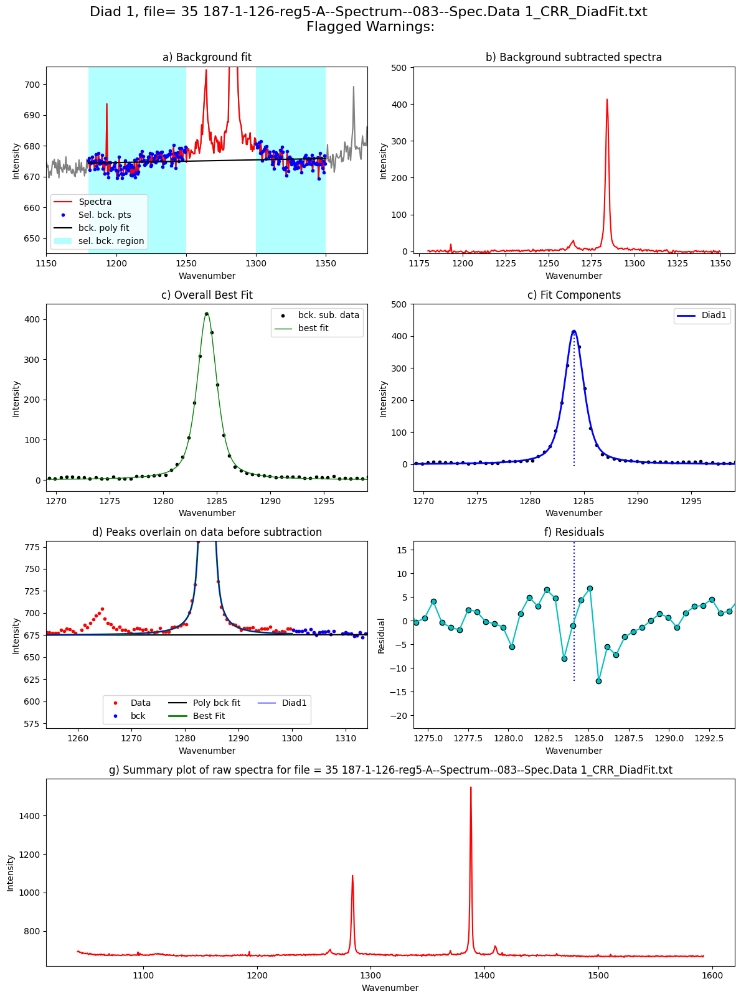

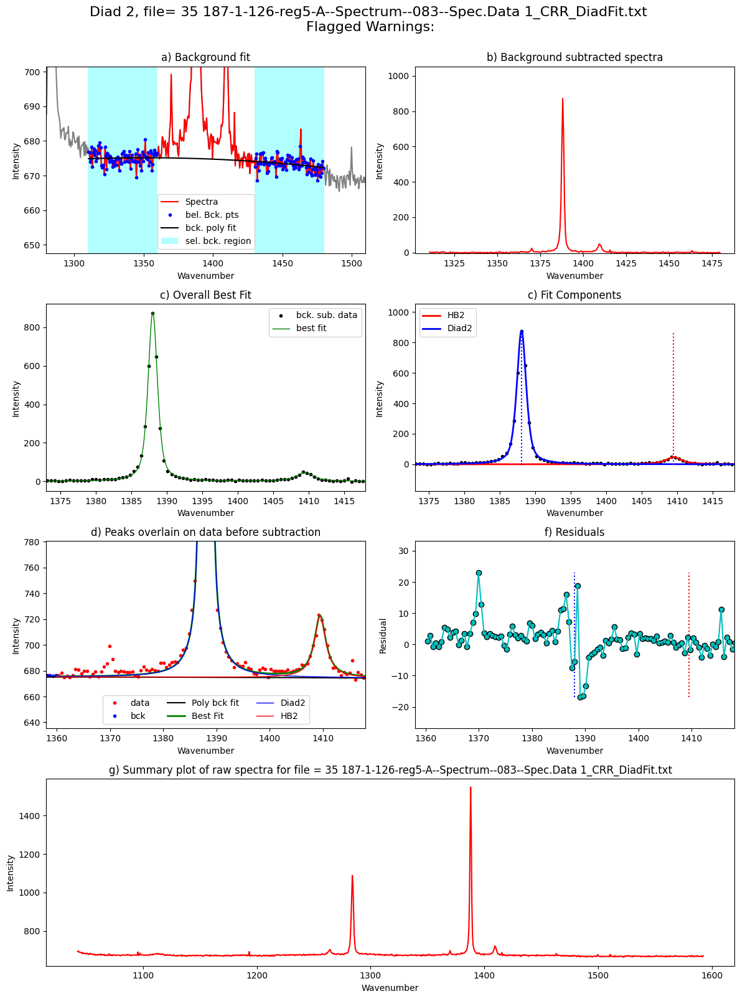

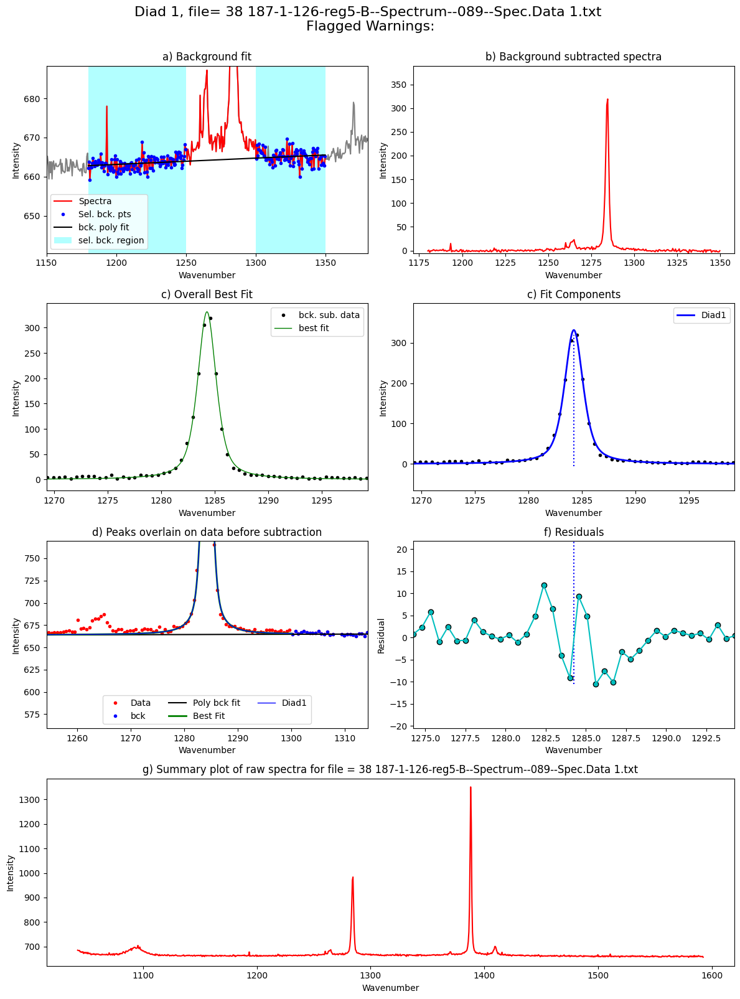

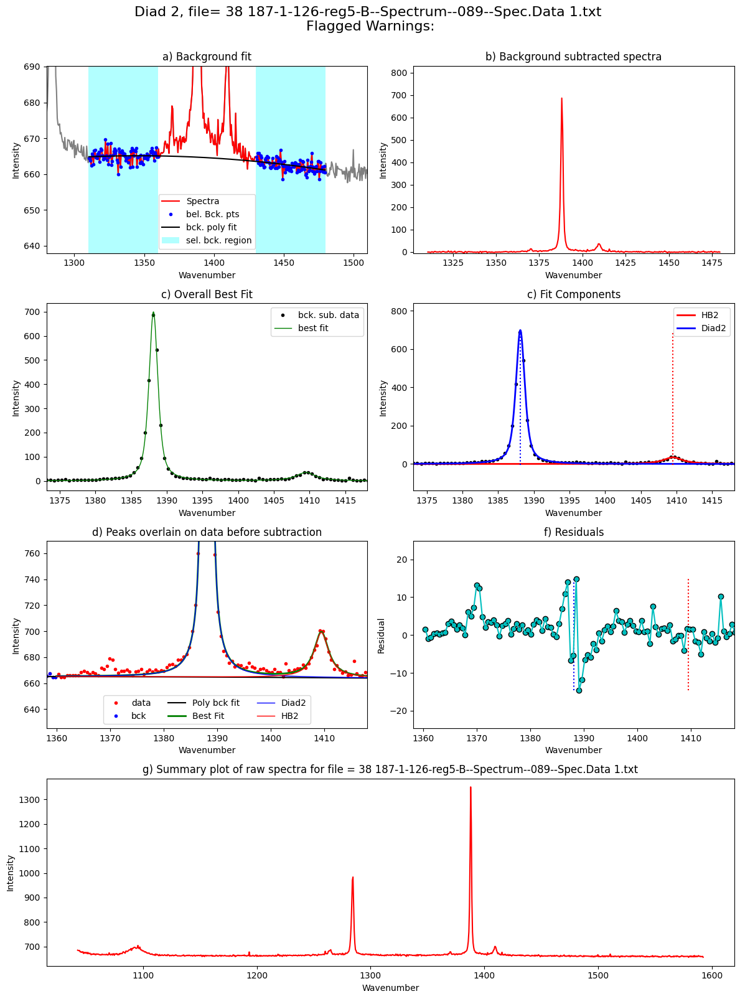

In [12]:
from tqdm import tqdm
plot_figure=True# If False, Means doesnt have to make figures, lot faster. 
close_figure=False # If True, wont show figures in notebook, but will still save them in a folder 
Diad_Files_i=Diad_Files
df_Merge = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files))): #
    tqdm.write(f"Processing file: {Diad_Files[i]}")
    
    
    # For diad1, config file like you had in the previous. 
    # Only really used to exclude a range (say your spectra has a known spec)
    diad_id_config=pf.diad_id_config(exclude_range1=[1308, 1309])
    
    # Here, the prominence are taken from the fitting in the last notebook
    diad1_fit_config2.HB_prom=GroupN_df['HB1_abs_prom'].iloc[i]
    diad1_fit_config2.diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i]
    diad1_fit_config2.gauss_amp=2*GroupN_df['HB1_abs_prom'].iloc[i]

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config2,
    config2=diad_id_config, path=spectra_path, filename=GroupN_df['filename'].iloc[i],
    filetype=spectra_filetype, plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
    HB_pos=GroupN_df['HB1_pos'].iloc[i])

    ## Same for diad2, just also has a C13 peak
    diad2_fit_config_init.HB_prom=GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i]
    diad2_fit_config_init.gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.C13_prom=GroupN_df['C13_abs_prom'].iloc[i]
    
    
    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
        config2=diad_id_config,
    path=spectra_path, filename=GroupN_df['filename'].iloc[i], 
    filetype=spectra_filetype,
    plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
    HB_pos=GroupN_df['HB2_pos'].iloc[i], 
    C13_pos=GroupN_df['C13_pos'].iloc[i])
    
    # This combines the outputs into a single dataframe
    data=pf.combine_diad_outputs(filename=GroupN_df['filename'].iloc[i], prefix=prefix, 
    Diad1_fit=Diad1_fit, path=spectra_path,                  
    Diad2_fit=Diad2_fit)        
    
 

    df_Merge = pd.concat([df_Merge, data], axis=0).reset_index(drop=True)


In [13]:
# Save parameters to excel
combo=df_Merge

if batch=='Weak':
    combo.to_excel('Weak_Diads.xlsx', index=False)
if batch=='Medium':
    combo.to_excel('Medium_Diads.xlsx', index=False)
if batch=='Strong':
    combo.to_excel('Strong_Diads.xlsx', index=False)

In [14]:
combo

,filename,Splitting,Split_σ,Diad1_Combofit_Cent,Diad1_cent_err,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Residual,...,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad1_PDF_Model,Diad2_PDF_Model
0,187-1-126-reg1-A--Spectrum--015--Spec.Data 1_C...,103.932958,0.011419,1284.091131,0.010141,280.679513,1284.091131,818.540114,1.057252,3.512647,...,1.147458,1.142163,0.311800,0.007534,1.034335,1.081123,0.054677,0.002754,PseudoVoigtModel,PseudoVoigtModel
1,187-1-126-reg1-B--Spectrum--018--Spec.Data 1_C...,103.847901,0.018508,1284.296642,0.017209,110.212526,1284.296642,294.221991,1.036132,2.228181,...,1.276515,1.302949,0.573012,0.018802,1.006834,1.057627,0.010056,0.006112,PseudoVoigtModel,PseudoVoigtModel
2,187-1-126-reg1-C--Spectrum--022--Spec.Data 1_C...,103.813711,0.020218,1284.326163,0.018807,87.892458,1284.326163,235.579604,1.010454,1.682909,...,1.476190,1.271329,0.962338,0.022993,1.071090,1.029752,0.104200,0.007977,PseudoVoigtModel,PseudoVoigtModel
3,187-1-126-reg1-D--Spectrum--025--Spec.Data 1,103.925871,0.033480,1284.103912,0.032102,52.206288,1284.103912,151.656041,1.122043,1.542921,...,1.614035,1.375821,1.377947,0.042985,1.033493,1.073950,0.048086,0.012145,PseudoVoigtModel,PseudoVoigtModel
4,187-1-126-reg1-E--Spectrum--028--Spec.Data 1,103.926181,0.008316,1284.087295,0.007947,463.285063,1284.087295,1348.720090,1.081021,5.119045,...,1.133333,1.135773,0.288272,0.004667,1.048352,1.088710,0.075468,0.001587,PseudoVoigtModel,PseudoVoigtModel
5,187-1-126-reg1-F--Spectrum--031--Spec.Data 1,103.963348,0.008687,1284.036165,0.008297,389.499148,1284.036165,1120.272473,1.086617,4.482756,...,1.156406,1.150121,0.339907,0.005580,1.062500,1.107843,0.096716,0.001858,PseudoVoigtModel,PseudoVoigtModel
6,187-1-126-reg1-G--Spectrum--035--Spec.Data 1_C...,103.862282,0.009249,1284.233706,0.008814,322.174052,1284.233706,892.466378,1.022959,3.774235,...,1.341699,1.321727,0.699088,0.006350,1.033860,1.036918,0.051034,0.002292,PseudoVoigtModel,PseudoVoigtModel
7,187-1-126-reg1-H--Spectrum--039--Spec.Data 1,104.024635,0.008400,1283.896259,0.008077,454.450300,1283.896259,1371.009137,1.133629,4.968208,...,1.159744,1.144509,0.362182,0.004989,1.111364,1.087637,0.173732,0.001574,PseudoVoigtModel,PseudoVoigtModel
8,187-1-126-reg1-I--Spectrum--042--Spec.Data 1_C...,103.934924,0.018240,1284.093184,0.018084,453.522916,1284.093184,1301.961401,1.079165,4.568848,...,1.137874,1.191595,0.297577,0.004759,1.045852,1.086179,0.071516,0.001606,PseudoVoigtModel,PseudoVoigtModel
9,187-1-126-reg1-J--Spectrum--045--Spec.Data 1,103.907754,0.009747,1284.177008,0.009301,256.162503,1284.177008,733.777858,1.071422,3.070131,...,1.188908,1.216418,0.404801,0.008365,1.039301,1.090461,0.061161,0.002841,PseudoVoigtModel,PseudoVoigtModel


### This plays a sound when the notebook is done if you have a tendency to procrastinate

In [15]:
# !pip install winotify

from winotify import Notification, audio

toast= Notification(app_id="VSCode",title="Notebook completed",
                    msg="Step3b_Secondary_Peaks is done!",
                    duration="short")
toast.set_audio(audio.Mail,loop=False)
toast.show()